In [1]:
# NOTE: coding is utf-8
import numpy as np
import pandas as pd
import seaborn as sns

In [2]:
# dmu_data = pd.read_excel('/Users/abrarrahman/Downloads/Prelim results july/DMU_120_final.xlsx')
towt_data = pd.read_excel('/Users/abrarrahman/Downloads/Prelim results july/TOWT_120_final.xlsx')
# wmu_data = pd.read_excel('/Users/abrarrahman/Downloads/Prelim results july/WMU_120_final.xlsx')
# te_data = pd.read_csv('/Users/abrarrahman/Downloads/Prelim results july/t_e50.csv')
default_data = pd.read_csv('/Users/abrarrahman/Downloads/Prelim results july/default.csv')


In [3]:
data_list = [towt_data, default_data]
weekdays_list = []
weekends_list = []

for data in data_list:
    data = data.infer_objects()
    data['Date'] = pd.to_datetime(data.Date)
    data['Hour'] = data.Date.dt.hour
    data['Month'] = data.Date.dt.month_name()
    data['Day'] = data.Date.dt.day_name()

    weekdays_list.append(data[(data['Day']=='Monday') | (data['Day']=='Tuesday') | (data['Day']=='Wednesday') | (data['Day']=='Thursday') | (data['Day']=='Friday')])
    weekends_list.append(data[(data['Day'] == 'Saturday') | (data['Day'] == 'Sunday')])

,meterID,Date,Algorithm,NMBE,Hour,Month,Day
0,12_T_DC_21.1,2014-01-31 00:00:00,Day Matching Unadjusted,-0.045314,0,January,Friday
1,12_T_DC_21.2,2014-01-31 01:00:00,Day Matching Unadjusted,-0.095794,1,January,Friday
2,12_T_DC_21.3,2014-01-31 02:00:00,Day Matching Unadjusted,-0.091968,2,January,Friday
3,12_T_DC_21.4,2014-01-31 03:00:00,Day Matching Unadjusted,-0.106773,3,January,Friday
4,12_T_DC_21.5,2014-01-31 04:00:00,Day Matching Unadjusted,-0.110437,4,January,Friday


In [7]:
month_to_season = {
    "December": "Winter",
    "January": "Winter",
    "February": "Winter",
    "March": "Spring",
    "April": "Spring",
    "May": "Spring",
    "June": "Summer",
    "July": "Summer",
    "August": "Summer",
    "September": "Autumn",
    "October": "Autumn",
    "November": "Autumn"
}

for i in range(len(weekdays_list)):
    weekdays_list[i]["Season"] = weekdays_list[i]["Month"].map(month_to_season)
    weekends_list[i]["Season"] = weekends_list[i]["Month"].map(month_to_season)


<ipython-input-7-487bab4ac9a9>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weekdays_list[i]["Season"] = weekdays_list[i]["Month"].map(month_to_season)
<ipython-input-7-487bab4ac9a9>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weekends_list[i]["Season"] = weekends_list[i]["Month"].map(month_to_season)


,meterID,Date,Algorithm,NMBE,Hour,Month,Day,Season
0,12_T_DC_140.1,2014-01-28 00:00:00,Unweighted_TOWT_7 Days Unadjusted,-0.019220,0,January,Tuesday,Winter
1,12_T_DC_140.2,2014-01-28 01:00:00,Unweighted_TOWT_7 Days Unadjusted,0.117134,1,January,Tuesday,Winter
2,12_T_DC_140.3,2014-01-28 02:00:00,Unweighted_TOWT_7 Days Unadjusted,0.108223,2,January,Tuesday,Winter
3,12_T_DC_140.4,2014-01-28 03:00:00,Unweighted_TOWT_7 Days Unadjusted,0.126495,3,January,Tuesday,Winter
4,12_T_DC_140.5,2014-01-28 04:00:00,Unweighted_TOWT_7 Days Unadjusted,0.122571,4,January,Tuesday,Winter


In [11]:
# RUNS SLOW
# SKIP IF METERID NOT IN FORMAT <METER_NAME.ENTRY_NUM>

all_weekdays_split = []
all_weekends_split = []

for i in range(len(weekdays_list)):
    weekdays_split = {}
    weekends_split = {}
    
    for index, row in weekdays_list[i].iterrows():
        this_meter = row["meterID"].split(".")[0]
        this_row_dict = {
            "meterID": row["meterID"],
            "Date": row["Date"],
            "Algorithm": row["Algorithm"],
            "NMBE": row["NMBE"],
            "Hour": row["Hour"],
            "Month": row["Month"],
            "Day": row["Day"],
            "Season": row["Season"],
        }
        
        if this_meter not in weekdays_split:
            weekdays_split[this_meter] = [this_row_dict]
        else:
            weekdays_split[this_meter].append(this_row_dict)
            
    for index, row in weekends_list[i].iterrows():
        this_meter = row["meterID"].split(".")[0]
        this_row_dict = {
            "meterID": row["meterID"],
            "Date": row["Date"],
            "Algorithm": row["Algorithm"],
            "NMBE": row["NMBE"],
            "Hour": row["Hour"],
            "Month": row["Month"],
            "Day": row["Day"],
            "Season": row["Season"],
        }
        
        if this_meter not in weekends_split:
            weekends_split[this_meter] = [this_row_dict]
        else:
            weekends_split[this_meter].append(this_row_dict)
    
    all_weekdays_split.append(weekdays_split)
    all_weekends_split.append(weekends_split)


{'12_T_DC_21': [{'meterID': '12_T_DC_21.1',
   'Date': Timestamp('2014-01-31 00:00:00'),
   'Algorithm': 'Day Matching Unadjusted',
   'NMBE': -0.0453135340833885,
   'Hour': 0,
   'Month': 'January',
   'Day': 'Friday',
   'Season': 'Winter'},
  {'meterID': '12_T_DC_21.2',
   'Date': Timestamp('2014-01-31 01:00:00'),
   'Algorithm': 'Day Matching Unadjusted',
   'NMBE': -0.0957938286502327,
   'Hour': 1,
   'Month': 'January',
   'Day': 'Friday',
   'Season': 'Winter'},
  {'meterID': '12_T_DC_21.3',
   'Date': Timestamp('2014-01-31 02:00:00'),
   'Algorithm': 'Day Matching Unadjusted',
   'NMBE': -0.0919684505131032,
   'Hour': 2,
   'Month': 'January',
   'Day': 'Friday',
   'Season': 'Winter'},
  {'meterID': '12_T_DC_21.4',
   'Date': Timestamp('2014-01-31 03:00:00'),
   'Algorithm': 'Day Matching Unadjusted',
   'NMBE': -0.106772514091476,
   'Hour': 3,
   'Month': 'January',
   'Day': 'Friday',
   'Season': 'Winter'},
  {'meterID': '12_T_DC_21.5',
   'Date': Timestamp('2014-01-31 

In [16]:
# SKIP IF METERID NOT IN FORMAT <METER_NAME.ENTRY_NUM>

towt_weekdays = all_weekdays_split[1]
default_weekends = all_weekdays_split[4]
towt_weekends = all_weekends_split[1]
default_weekends = all_weekends_split[4]

dict_to_df_list = [towt_weekdays, default_weekends, towt_weekends, default_weekends]
for dict_to_df in dict_to_df_list:
    for key, value in dict_to_df.items():
        dict_to_df[key] = pd.DataFrame(data=dict_to_df[key])

dict_to_df_list[0]['12_T_DC_140']

,meterID,Date,Algorithm,NMBE,Hour,Month,Day,Season
0,12_T_DC_140.1,2014-01-28 00:00:00,Unweighted_TOWT_7 Days Unadjusted,-0.019220,0,January,Tuesday,Winter
1,12_T_DC_140.2,2014-01-28 01:00:00,Unweighted_TOWT_7 Days Unadjusted,0.117134,1,January,Tuesday,Winter
2,12_T_DC_140.3,2014-01-28 02:00:00,Unweighted_TOWT_7 Days Unadjusted,0.108223,2,January,Tuesday,Winter
3,12_T_DC_140.4,2014-01-28 03:00:00,Unweighted_TOWT_7 Days Unadjusted,0.126495,3,January,Tuesday,Winter
4,12_T_DC_140.5,2014-01-28 04:00:00,Unweighted_TOWT_7 Days Unadjusted,0.122571,4,January,Tuesday,Winter
...,...,...,...,...,...,...,...,...
4459,12_T_DC_140.6428,2015-01-07 19:00:00,Unweighted_TOWT_7 Days Unadjusted,0.229071,19,January,Wednesday,Winter
4460,12_T_DC_140.6429,2015-01-07 20:00:00,Unweighted_TOWT_7 Days Unadjusted,0.235943,20,January,Wednesday,Winter
4461,12_T_DC_140.6430,2015-01-07 21:00:00,Unweighted_TOWT_7 Days Unadjusted,0.185000,21,January,Wednesday,Winter
4462,12_T_DC_140.6431,2015-01-07 22:00:00,Unweighted_TOWT_7 Days Unadjusted,0.193280,22,January,Wednesday,Winter


In [5]:
def custom_pivot_table(source: pd.DataFrame, index_col: str, aggregator) -> pd.DataFrame:
    return source.pivot_table(index=index_col, columns='Hour', values='mape', aggfunc=aggregator)

def excel_outputs(path: str, cases: list):
    with pd.ExcelWriter(path) as writer:
        for case in cases:
            custom_pivot_table(case[0], case[1], case[2]).to_excel(writer, sheet_name = case[3])

In [6]:
cases = [
    [weekdays, "Month", np.mean, "weekday_means"],
    [weekends, "Month", np.mean, "weekend_means"],
    [weekdays, "Month", np.median, "weekday_medians"],
    [weekends, "Month", np.median, "weekend_medians"],
    [weekdays, "Season", np.mean, "szn_weekday_means"],
    [weekends, "Season", np.mean, "szn_weekend_means"],
    [weekdays, "Season", np.median, "szn_weekday_medians"],
    [weekends, "Season", np.median, "szn_weekend_medians"]
]

excel_outputs('/Users/abrarrahman/Desktop/vermont_pivot_tables.xlsx', cases)

In [49]:
weekdays

,meterID,Date,Algorithm,mape,Hour,Month,Day,Season
0,VT_886.1,2014-03-05 00:00:00,Day Matching Unadjusted,2.213807,0,March,Wednesday,Spring
1,VT_886.2,2014-03-05 01:00:00,Day Matching Unadjusted,10.341273,1,March,Wednesday,Spring
2,VT_886.3,2014-03-05 02:00:00,Day Matching Unadjusted,3.571582,2,March,Wednesday,Spring
3,VT_886.4,2014-03-05 03:00:00,Day Matching Unadjusted,5.839354,3,March,Wednesday,Spring
4,VT_886.5,2014-03-05 04:00:00,Day Matching Unadjusted,0.237736,4,March,Wednesday,Spring
...,...,...,...,...,...,...,...,...
21187,VT_900.7028,2015-01-08 19:00:00,Day Matching Unadjusted,53.518578,19,January,Thursday,Winter
21188,VT_900.7029,2015-01-08 20:00:00,Day Matching Unadjusted,55.230859,20,January,Thursday,Winter
21189,VT_900.7030,2015-01-08 21:00:00,Day Matching Unadjusted,18.153368,21,January,Thursday,Winter
21190,VT_900.7031,2015-01-08 22:00:00,Day Matching Unadjusted,37.547627,22,January,Thursday,Winter


<AxesSubplot:>

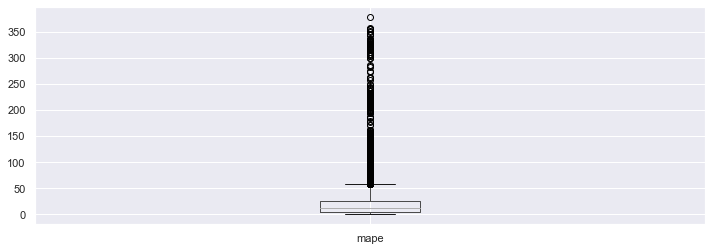

In [95]:
weekdays.boxplot("mape")

<AxesSubplot:xlabel='Season', ylabel='mape'>

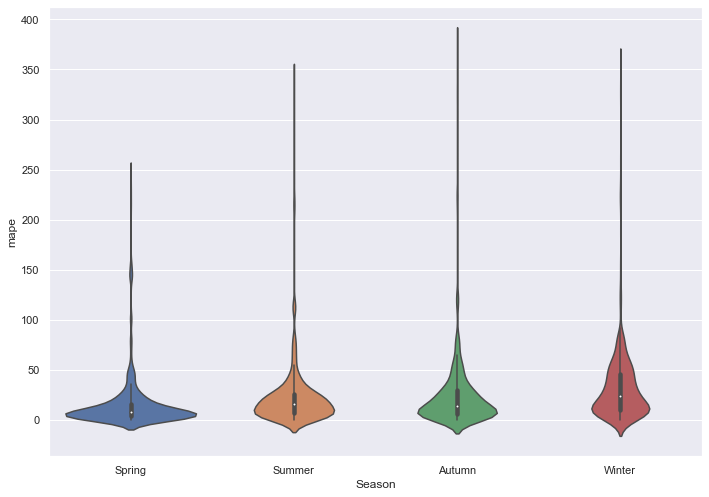

In [93]:
# TODO: comparative by location

a4_dims = (11.7, 8.27)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.violinplot(ax=ax, x="Season", y="mape", data=weekdays, inner="box")

<AxesSubplot:xlabel='Season', ylabel='mape'>

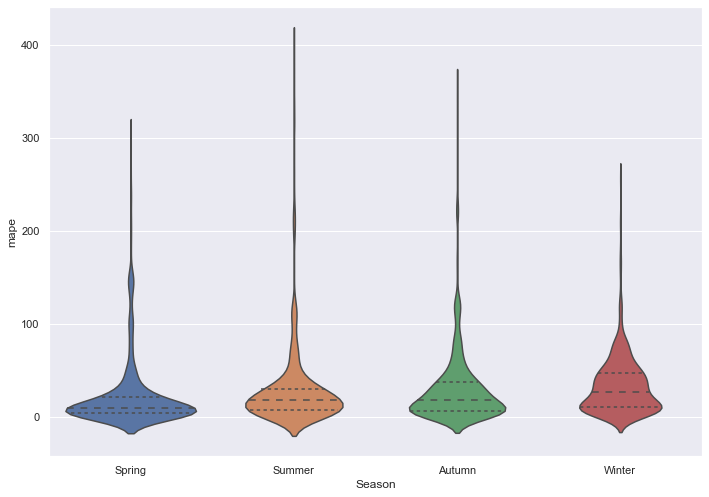

In [94]:
a4_dims = (11.7, 8.27)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.violinplot(ax=ax, x="Season", y="mape", data=weekends, inner="quartile")

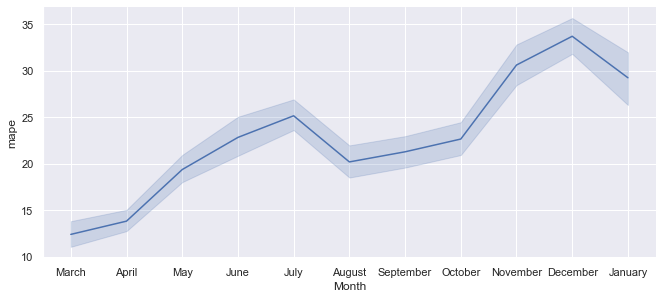

In [18]:
line = sns.relplot(x="Month", y="mape", kind="line", data=weekdays)
line.fig.set_size_inches(10,4)
line

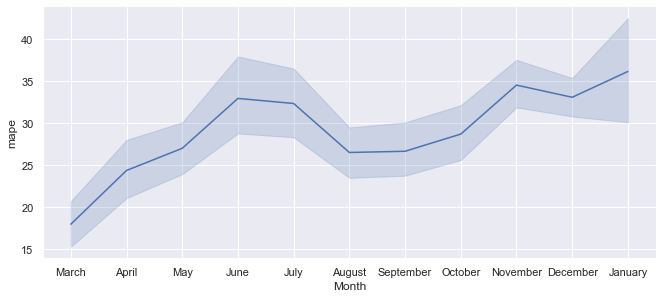

In [20]:
line = sns.relplot(x="Month", y="mape", kind="line", data=weekends)
line.fig.set_size_inches(10,4)
line

<AxesSubplot:xlabel='Hour', ylabel='Month'>

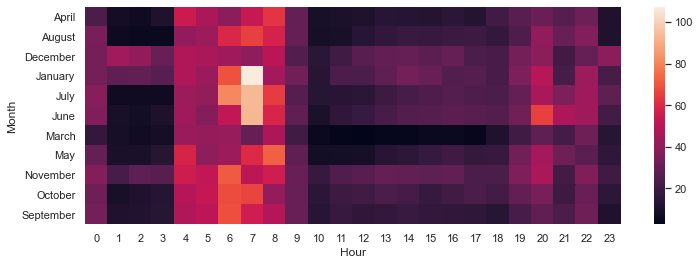

In [96]:
# TODO: change alphabetization
heatprep = weekends[["Hour","Month","Season","mape"]]
piv = pd.pivot_table(heatprep, values="mape",index=["Month"], columns=["Hour"], fill_value=0)

sns.heatmap(piv)

<AxesSubplot:xlabel='Hour', ylabel='Season'>

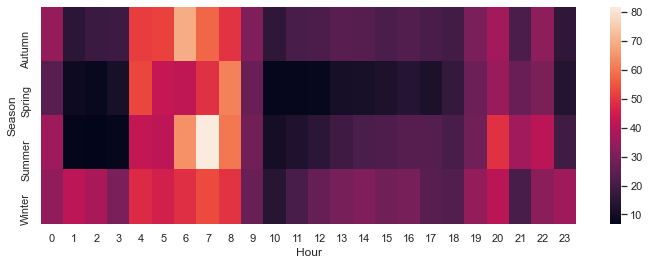

In [98]:
piv = pd.pivot_table(heatprep, values="mape",index=["Season"], columns=["Hour"], fill_value=0)

sns.heatmap(piv)